In [1]:
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
import itertools

In [2]:
df = pd.read_excel(r'data.xlsx')
columns = ['Salary','DOJ','DOL','Designation','JobCity','Gender','10percentage','10board','12graduation','12percentage','12board','CollegeTier','Degree','Specialization','collegeGPA','CollegeCityID','CollegeCityTier','CollegeState','GraduationYear','English','Logical','Quant','Domain','ComputerProgramming','ElectronicsAndSemicon','ComputerScience','MechanicalEngg','ElectricalEngg','TelecomEngg','CivilEngg','conscientiousness','agreeableness','extraversion','nueroticism','openess_to_experience']
numeric_columns = ['Salary','10percentage','12percentage','collegeGPA','English','Logical','Quant','Domain','ComputerProgramming','ElectronicsAndSemicon','ComputerScience','MechanicalEngg','ElectricalEngg','TelecomEngg','CivilEngg','conscientiousness','agreeableness','extraversion','nueroticism','openess_to_experience']
categorical_columns = ['Designation','JobCity','Gender','10board','12board','CollegeTier','Degree','Specialization','CollegeCityID','CollegeCityTier','CollegeState','GraduationYear']

In [3]:
df.replace(-1,0,inplace=True)

### Objective
To find some patterns and insights from the employability data through visualization of data.

### Data Description
The dataset was released by Aspiring Minds from the Aspiring Mind Employment Outcome 2015 (AMEO). The study is primarily limited  only to students with engineering disciplines. The dataset contains the employment outcomes of engineering graduates as dependent variables (Salary, Job Titles, and Job Locations) along with the standardized scores from three different areas – cognitive skills, technical skills and personality skills. The dataset also contains demographic features. The dataset  contains  around  40 independent variables and 4000 data points. The independent variables are both continuous and categorical in nature. The dataset contains a unique identifier for each candidate. Below mentioned table contains the details for the original dataset.  

### Indepth into data.

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 39 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Unnamed: 0             3998 non-null   object        
 1   ID                     3998 non-null   int64         
 2   Salary                 3998 non-null   int64         
 3   DOJ                    3998 non-null   datetime64[ns]
 4   DOL                    3998 non-null   object        
 5   Designation            3998 non-null   object        
 6   JobCity                3998 non-null   object        
 7   Gender                 3998 non-null   object        
 8   DOB                    3998 non-null   datetime64[ns]
 9   10percentage           3998 non-null   float64       
 10  10board                3998 non-null   object        
 11  12graduation           3998 non-null   int64         
 12  12percentage           3998 non-null   float64       
 13  12b

In [5]:
df.describe()

,ID,Salary,10percentage,12graduation,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
count,3.998000e+03,3.998000e+03,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000
mean,6.637945e+05,3.076998e+05,77.925443,2008.087544,74.466366,5156.851426,1.925713,71.486171,5156.851426,0.300400,2012.105803,501.649075,501.598799,513.378189,0.572020,353.319910,96.042271,91.516758,23.915958,17.438469,32.757629,3.673337,-0.037831,0.146496,0.002763,-0.169033,-0.138110
std,3.632182e+05,2.127375e+05,9.850162,1.653599,10.999933,4802.261482,0.262270,8.167338,4802.261482,0.458489,31.857271,104.940021,86.783297,122.302332,0.302460,204.981129,157.806602,174.867677,97.893295,87.394072,104.568796,36.559052,1.028666,0.941782,0.951471,1.007580,1.008075
min,1.124400e+04,3.500000e+04,43.000000,1995.000000,40.000000,2.000000,1.000000,6.450000,2.000000,0.000000,0.000000,180.000000,195.000000,120.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-4.126700,-5.781600,-4.600900,-2.643000,-7.375700
25%,3.342842e+05,1.800000e+05,71.680000,2007.000000,66.000000,494.000000,2.000000,66.407500,494.000000,0.000000,2012.000000,425.000000,445.000000,430.000000,0.342315,295.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.713525,-0.287100,-0.604800,-0.868200,-0.669200
50%,6.396000e+05,3.000000e+05,79.150000,2008.000000,74.400000,3879.000000,2.000000,71.720000,3879.000000,0.000000,2013.000000,500.000000,505.000000,515.000000,0.622643,415.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.046400,0.212400,0.091400,-0.234400,-0.094300
75%,9.904800e+05,3.700000e+05,85.670000,2009.000000,82.600000,8818.000000,2.000000,76.327500,8818.000000,1.000000,2014.000000,570.000000,565.000000,595.000000,0.842248,495.000000,233.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.702700,0.812800,0.672000,0.526200,0.502400
max,1.298275e+06,4.000000e+06,97.760000,2013.000000,98.700000,18409.000000,2.000000,99.930000,18409.000000,1.000000,2017.000000,875.000000,795.000000,900.000000,0.999910,840.000000,612.000000,715.000000,623.000000,676.000000,548.000000,516.000000,1.995300,1.904800,2.535400,3.352500,1.822400


## Univariate Analysis

#### Boxplots (Numerical)

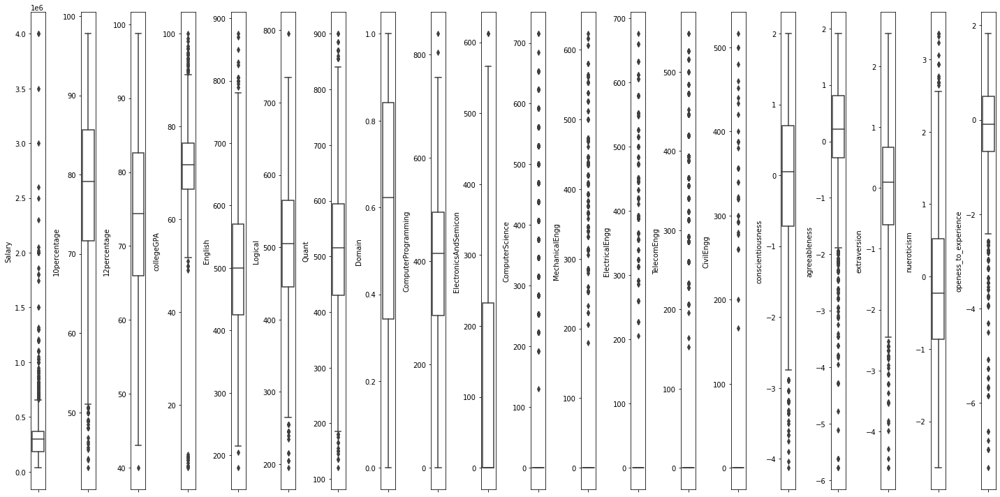

In [6]:
def plot(df):
  columns = df.select_dtypes(include=np.number).columns
  figure = plt.figure(figsize=(20, 10))
  figure.add_subplot(1, len(columns), 1)
  for index, col in enumerate(columns):
          if index > 0:
              figure.add_subplot(1, len(columns), index + 1)
          sns.boxplot(y=col, data=df, boxprops={'facecolor': 'None'})
  figure.tight_layout()
  plt.show()

plot(df[numeric_columns])

<b>Obeservation:- </b> Most of the variables have outliers in them. Domain and Computer Programming are the only ones with least number of outliers

#### Count Distribution (Categorical and Numerical)

In [7]:
def top5(df):
    columns = df.select_dtypes(include=['object', 'category']).columns
    for col in columns:
        print("Top 5 unique values of " + col)
        print(df[col].value_counts().reset_index().rename(columns={"index": col, col: "Count"})[
              :min(5, len(df[col].value_counts()))])
        print(" ")
def freq_plot(df):
  print(df.select_dtypes(include=['object', 'category']).nunique())
  top5(df)
  for col in df.select_dtypes(include='category').columns:
        fig = sns.catplot(x=col, kind="count", data=df, hue=hue)
        fig.set_xticklabels(rotation=90)
        plt.show()

In [8]:
freq_plot(df[categorical_columns])

Designation       419
JobCity           339
Gender              2
10board           275
12board           340
Degree              4
Specialization     46
CollegeState       26
dtype: int64
Top 5 unique values of Designation
          Designation  Count
0   software engineer    539
1  software developer    265
2     system engineer    205
3  programmer analyst    139
4    systems engineer    118
 
Top 5 unique values of JobCity
     JobCity  Count
0  Bangalore    627
1          0    461
2      Noida    368
3  Hyderabad    335
4       Pune    290
 
Top 5 unique values of Gender
  Gender  Count
0      m   3041
1      f    957
 
Top 5 unique values of 10board
       10board  Count
0         cbse   1395
1  state board   1164
2            0    350
3         icse    281
4          ssc    122
 
Top 5 unique values of 12board
       12board  Count
0         cbse   1400
1  state board   1254
2            0    359
3         icse    129
4     up board     87
 
Top 5 unique values of Degree
       

<b>Obeservation -</b> Variables like Gender, CollegeTier, CollegeCityTier, Degree have one dominant category. It may cause some bias in the model and favour one category while predicting.

#### Probablity Distribution (Numerical)

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:392: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


<Figure size 7200x7200 with 0 Axes>

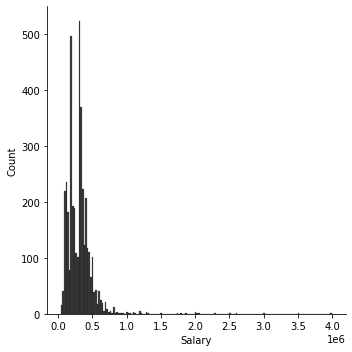

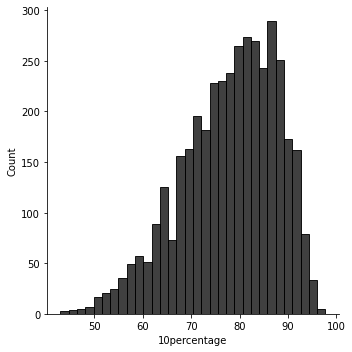

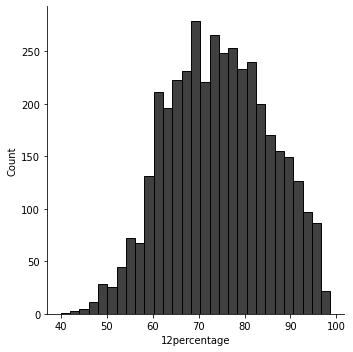

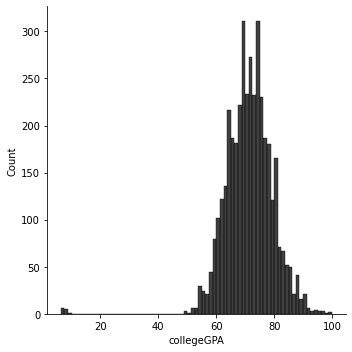

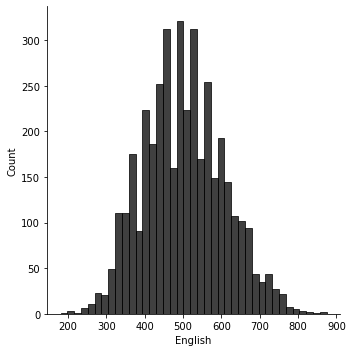

...

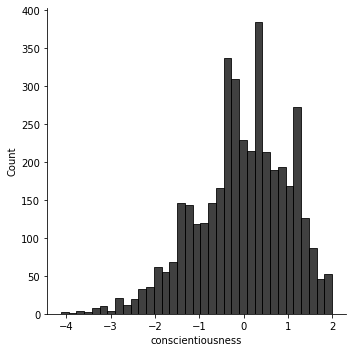

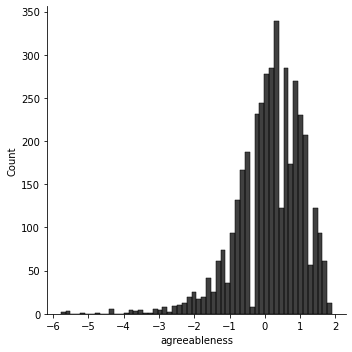

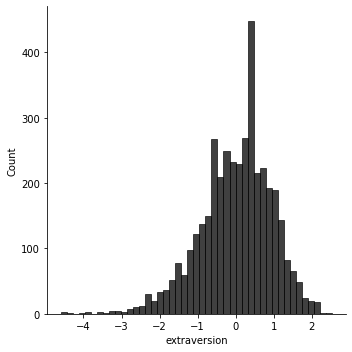

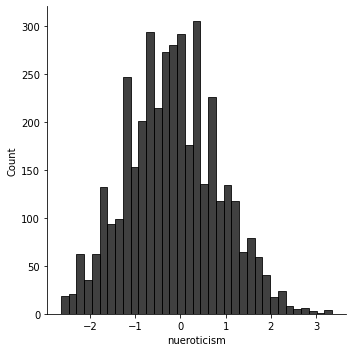

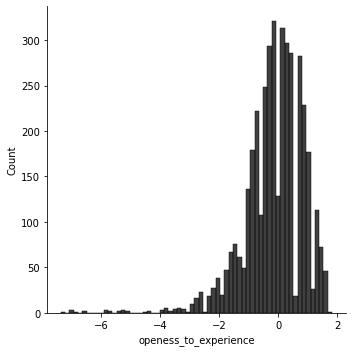

In [9]:
fig2 = plt.figure(figsize=(100,100))
for col in numeric_columns:
    sns.displot(df[col],color='k',orien)
    plt.plot()

<b>Obeservation - </b> Some of the variables are normally distributed but they are skewed. Possible solution can be removing outliers and using box-cox transformations to increase their predictive power. While some of them are not at all normally distributed. Possible solutions can be normalization and box-cox transformation.

## Bivariate Analysis

### Numeric vs Numeric

<Figure size 7200x7200 with 0 Axes>

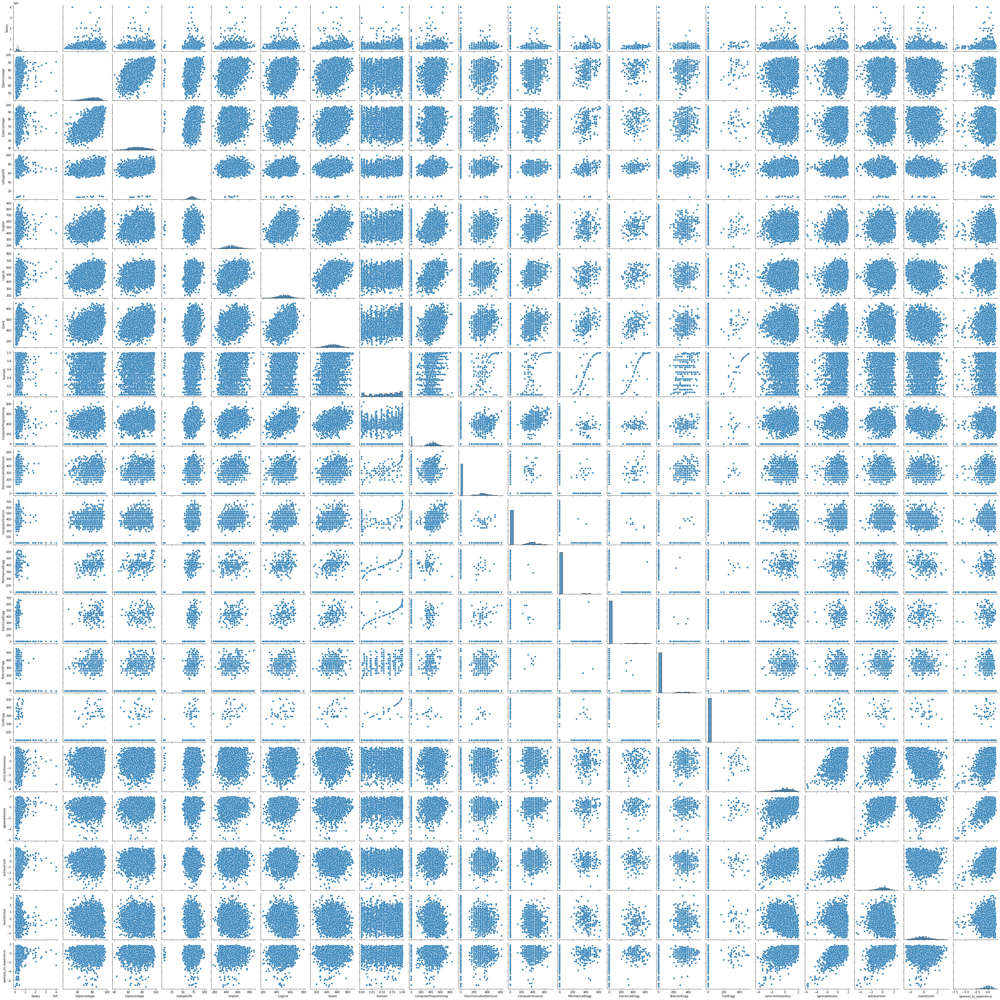

In [10]:
fig3 = plt.figure(figsize=(100,100))
sns.pairplot(df[numeric_columns])

### Categorical vs Numerical

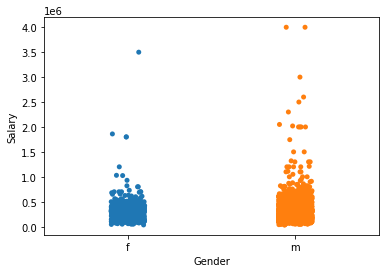

In [11]:
sns.stripplot(x='Gender',y='Salary',data=df)

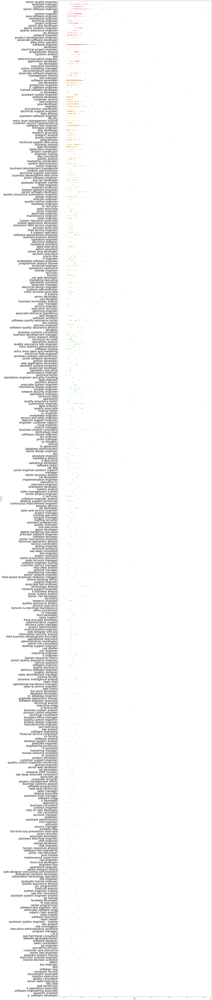

In [12]:
fig2, bar2 = plt.subplots(figsize=(30,200))
bar2.set_yticklabels(df.Designation.unique(),fontsize=30, ha= 'right');
sns.stripplot(y='Designation',x='Salary',data=df)

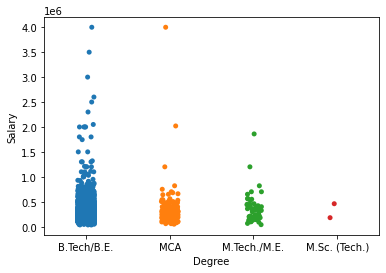

In [13]:
sns.stripplot(x='Degree',y='Salary',data=df)

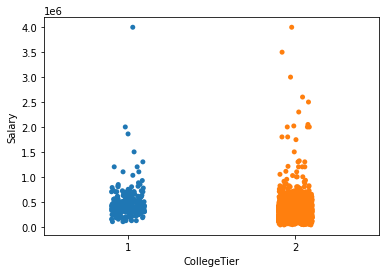

In [14]:
sns.stripplot(x='CollegeTier',y='Salary',data=df)

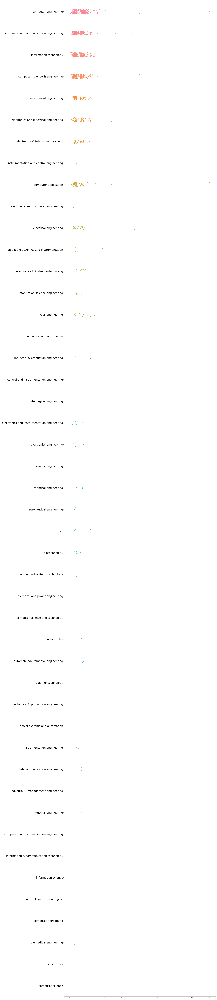

In [15]:
fig3, bar = plt.subplots(figsize=(30,200))
bar.set_yticklabels(df.Specialization.unique(),fontsize=30, ha= 'right');
sns.stripplot(y='Specialization',x='Salary',data=df)

<b>Obesrvation : </b> Most of the variables are either negetively or positevily correlated with other numerical category. Males have more salary outliers. 'Software Engineer' and 'Software Dev' designation has the most concentrations of salary between min and max. 'B.E/BTech' Specialization is highly concentrated with salary ramging from min to max with some outliers going outer than max salary. 'Tier 2' college is more concentrated than 'Tier 1' with more salary outliers closer or more than max. 'Computer Engineer' is the most popular Specialization with the highest concentration of datapoints and salary ranging from min to max with most of them concentrated at average.

## Research Questions

1) Times of India article dated Jan 18, 2019 states that “After doing your Computer Science
Engineering if you take up jobs as a Programming Analyst, Software Engineer,
Hardware Engineer and Associate Engineer you can earn up to 2.5-3 lakhs as a fresh
graduate.” Test this claim with the data given to you.

In [16]:
specialization = ['computer science & engineering']
designation = ['programmer analyst','software engineer','hardware engineer','associative engineer']
new_df = df[(df['Specialization'].isin(specialization)) & (df['Designation'].isin(designation))]
print('Mean: ',new_df['Salary'].mean())
print('Std: ',new_df['Salary'].std())

Mean:  331515.1515151515
Std:  126997.96455352778


<b>Observation : </b> On selecting all the rows with Specialization = 'Computer Science & Engineering' and Designation = ['Program Analyst' or 'Software Engineer' or 'Hardware Engineer' or 'Associative Engineer'] it was found that <b>Mean salary is 3.315 lakhs</b> with <b>Standard Deviation being 1.26 lakhs </b>. So it is concluded that If After doing your Computer Science Engineering if you take up jobs as a Programming Analyst, Software Engineer, Hardware Engineer and Associate Engineer you can earn salary upto <b>Mean-STD</b> to <b>Mean+STD</b> ie from 2.5 to 3 lakhs.

2) Is there a relationship between gender and specialisation? (i.e. Does the preference of
Specialisation depend on the Gender?)

In [17]:
pd.crosstab(columns=df['Gender'],index=df['Specialization'],normalize='index').round(3)*100

Gender,f,m
Specialization,,
aeronautical engineering,33.3,66.7
applied electronics and instrumentation,22.2,77.8
automobile/automotive engineering,0.0,100.0
biomedical engineering,100.0,0.0
biotechnology,60.0,40.0
ceramic engineering,0.0,100.0
chemical engineering,11.1,88.9
civil engineering,20.7,79.3
computer and communication engineering,0.0,100.0


<b>Obesrvation : </b> As we can see from the above cross tab that most 'Female' choose Specializations like ['Biomedical Engineering','Information & Communication Technology'] and 'Male' do not prefer these while most 'Male' prefer Specializations like ['Polymer Systems and Automation','Polymer Technology','Mechanical & Automation','Other hardware related specializations'] that 'Females' do not prefer.
As the data points are not evenly distributed among 'Male' and 'Female' it can be concluded that <b>There is a relation between Specialization and Gender and the preference of Specialization depend on Gender</b> 

## Conclusion
These points can be concluded from the above data.


*   Most of the variables in the data depend on other variable.(Both positive and negetively corelated)

*   Some of the data has many outliers.


*   Predictive power of data is low.


*   Data contains unnecessary variables with almost 0 corelation with other variables.

*   Data is not normally distributed and most of the variables are skewed.



*   Data is unevenly distributed in some cases like Degree, Gender, CollegeTier, CollegeCityTier with one dominant category.






## More Research Questions


1.   Is Salary Dependent on Specialization, Degree, CollegeTier.
2.   Is Quant, Logical, Domain scores dependent on Specializations
3.   Does Gender affect Salary for same roles?



## Data PreProcessing

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 39 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Unnamed: 0             3998 non-null   object        
 1   ID                     3998 non-null   int64         
 2   Salary                 3998 non-null   int64         
 3   DOJ                    3998 non-null   datetime64[ns]
 4   DOL                    3998 non-null   object        
 5   Designation            3998 non-null   object        
 6   JobCity                3998 non-null   object        
 7   Gender                 3998 non-null   object        
 8   DOB                    3998 non-null   datetime64[ns]
 9   10percentage           3998 non-null   float64       
 10  10board                3998 non-null   object        
 11  12graduation           3998 non-null   int64         
 12  12percentage           3998 non-null   float64       
 13  12b

In [19]:
df = df[columns]
df = df.drop(columns=['DOJ','DOL'])

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 33 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Salary                 3998 non-null   int64  
 1   Designation            3998 non-null   object 
 2   JobCity                3998 non-null   object 
 3   Gender                 3998 non-null   object 
 4   10percentage           3998 non-null   float64
 5   10board                3998 non-null   object 
 6   12graduation           3998 non-null   int64  
 7   12percentage           3998 non-null   float64
 8   12board                3998 non-null   object 
 9   CollegeTier            3998 non-null   int64  
 10  Degree                 3998 non-null   object 
 11  Specialization         3998 non-null   object 
 12  collegeGPA             3998 non-null   float64
 13  CollegeCityID          3998 non-null   int64  
 14  CollegeCityTier        3998 non-null   int64  
 15  Coll

In [21]:
sc = StandardScaler(copy=False)
scaled_df = pd.DataFrame(sc.fit_transform(df[numeric_columns]),columns=numeric_columns)

In [22]:
scaled_df.head()

,Salary,10percentage,12percentage,collegeGPA,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,0.527947,0.647233,1.939676,0.797646,0.127240,0.961148,0.095037,0.211487,0.447317,-0.608684,-0.523414,-0.244337,-0.199563,-0.313303,-0.100489,0.983466,0.707581,0.550939,1.512658,-0.304966
1,0.904045,0.758921,0.957729,-0.174641,1.842720,1.249258,2.180295,1.284900,-1.723886,2.344667,-0.523414,-0.244337,-0.199563,-0.313303,-0.100489,-0.676367,0.246801,1.300083,0.060978,0.993910
2,0.081332,0.718307,-0.569744,-0.181988,1.080285,0.500173,-1.172473,-0.400578,0.203362,-0.608684,-0.523414,-0.244337,-0.199563,-0.313303,-0.100489,0.301041,1.661318,0.169167,-0.693995,0.803821
3,3.724775,0.779227,0.830439,0.386200,1.270894,0.961148,0.912785,1.330508,1.276765,-0.608684,-0.523414,-0.244337,-0.199563,-0.313303,-0.100489,0.081894,0.210589,-0.364495,-0.237001,-0.775129
4,-0.506320,0.007570,0.212176,0.295584,0.413154,1.422124,-0.395612,-1.479778,-1.723886,0.867992,-0.523414,-0.244337,-0.199563,-0.313303,-0.100489,-0.819775,-0.452174,-1.127304,0.258734,0.008542


In [23]:
encoded_df = pd.get_dummies(df,columns=categorical_columns,drop_first=True)

In [24]:
encoded_df[numeric_columns] = scaled_df[numeric_columns]

In [26]:
preprocessed_df = encoded_df

In [27]:
preprocessed_df.describe()

,Salary,10percentage,12graduation,12percentage,collegeGPA,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,Designation_.net web developer,Designation_account executive,Designation_account manager,Designation_admin assistant,Designation_administrative coordinator,Designation_administrative support,Designation_aircraft technician,Designation_android developer,Designation_application developer,Designation_application engineer,Designation_apprentice,Designation_ase,Designation_asp.net developer,Designation_assistant administrator,Designation_assistant electrical engineer,Designation_assistant engineer,Designation_assistant manager,Designation_assistant professor,Designation_assistant programmer,...,CollegeCityID_17935,CollegeCityID_18103,CollegeCityID_18139,CollegeCityID_18409,CollegeCityTier_1,CollegeState_Assam,CollegeState_Bihar,CollegeState_Chhattisgarh,CollegeState_Delhi,CollegeState_Goa,CollegeState_Gujarat,CollegeState_Haryana,CollegeState_Himachal Pradesh,CollegeState_Jammu and Kashmir,CollegeState_Jharkhand,CollegeState_Karnataka,CollegeState_Kerala,CollegeState_Madhya Pradesh,CollegeState_Maharashtra,CollegeState_Meghalaya,CollegeState_Orissa,CollegeState_Punjab,CollegeState_Rajasthan,CollegeState_Sikkim,CollegeState_Tamil Nadu,CollegeState_Telangana,CollegeState_Union Territory,CollegeState_Uttar Pradesh,CollegeState_Uttarakhand,CollegeState_West Bengal,GraduationYear_2007,GraduationYear_2009,GraduationYear_2010,GraduationYear_2011,GraduationYear_2012,GraduationYear_2013,GraduationYear_2014,GraduationYear_2015,GraduationYear_2016,GraduationYear_2017
count,3.998000e+03,3.998000e+03,3998.000000,3.998000e+03,3.998000e+03,3.998000e+03,3.998000e+03,3.998000e+03,3.998000e+03,3.998000e+03,3.998000e+03,3.998000e+03,3.998000e+03,3.998000e+03,3.998000e+03,3.998000e+03,3.998000e+03,3.998000e+03,3.998000e+03,3.998000e+03,3.998000e+03,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,...,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000
mean,8.257249e-17,-1.601493e-15,2008.087544,6.957361e-16,-1.021402e-15,3.598922e-17,2.612343e-16,4.431450e-16,4.722197e-17,2.363598e-16,1.259067e-16,2.615050e-16,7.839874e-16,-2.890662e-16,1.201029e-16,8.207333e-16,-1.060793e-17,-2.643653e-17,8.464132e-17,7.553293e-18,2.499251e-17,0.001001,0.001001,0.000250,0.000500,0.000250,0.000250,0.000250,0.011506,0.013007,0.005503,0.000750,0.000750,0.006503,0.000250,0.000500,0.001001,0.013007,0.003002,0.000750,...,0.000250,0.000500,0.000250,0.000250,0.300400,0.001251,0.002501,0.006753,0.040520,0.000250,0.006003,0.045023,0.004002,0.001751,0.007004,0.092546,0.008254,0.047274,0.065533,0.000500,0.043022,0.048274,0.043522,0.000750,0.091796,0.079790,0.001251,0.228864,0.028264,0.049025,0.000250,0.006003,0.073037,0.126813,0.211856,0.295398,0.259130,0.023512,0.001751,0.002001
std,1.000125e+00,1.000125e+00,1.653599,1.000125e+00,1.000125e+00,1.000125e+00,1.000125e+00,1.000125e+00,1.000125e+00,1.000125e+00,1.000125e+00,1.000125e+00,1.000125e+00,1.000125e+00,1.000125e+00,1.000125e+00,1.000125e+00,1.000125e+00,1.000125e+00,1.000125e+00,1.000125e+00,0.031619,0.031619,0.015815,0.022363,0.015815,0.015815,0.015815,0.106659,0.113316,0.073985,0.027386,0.027386,0.080390,0.015815,0.022363,0.031619,0.113316,0.054711,0.0273

In [28]:
preprocessed_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Columns: 2825 entries, Salary to GraduationYear_2017
dtypes: float64(20), int64(1), uint8(2804)
memory usage: 11.3 MB
